# Import and set colors

In [1]:
#Import packages
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import cm, colors
from gprofiler import gprofiler

import os 

import seaborn as sb
import scvi
from scvi.model.utils import mde
import pymde

Global seed set to 0


In [2]:
plt.rcParams['figure.figsize']=(4,3) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=False, fontsize=12, color_map='plasma')
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.22.3 scipy==1.8.0 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.4


In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Set project file paths

We set up the file paths to the respective directories.

In [4]:
file_path = '/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/'
#this is my file path please adapt it to your directory

In [5]:
data_dir =file_path +  'data/' 

In [6]:
table_dir = file_path + 'tables'

In [7]:
sc.settings.figdir = file_path + 'figures/'

In [8]:
import datetime

today = datetime.date.today().strftime('%y%m%d') #creates a YYMMDD string of today's date

# Read Data & downstream analysis

In [9]:
adata_postnorm = sc.read(data_dir + "/230516data_postnorm_all_earlytp.h5ad")

In [10]:
# scale and store results in layer
adata_postnorm.layers['scaled'] = sc.pp.scale(adata_postnorm, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## Highly Variable Genes

In [11]:
sc.pp.highly_variable_genes(adata_postnorm, flavor='cell_ranger', n_top_genes=2000,batch_key='batch')
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_postnorm.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 2000


/opt/anaconda3/envs/sc_tutorial_020321_scvi_040523/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


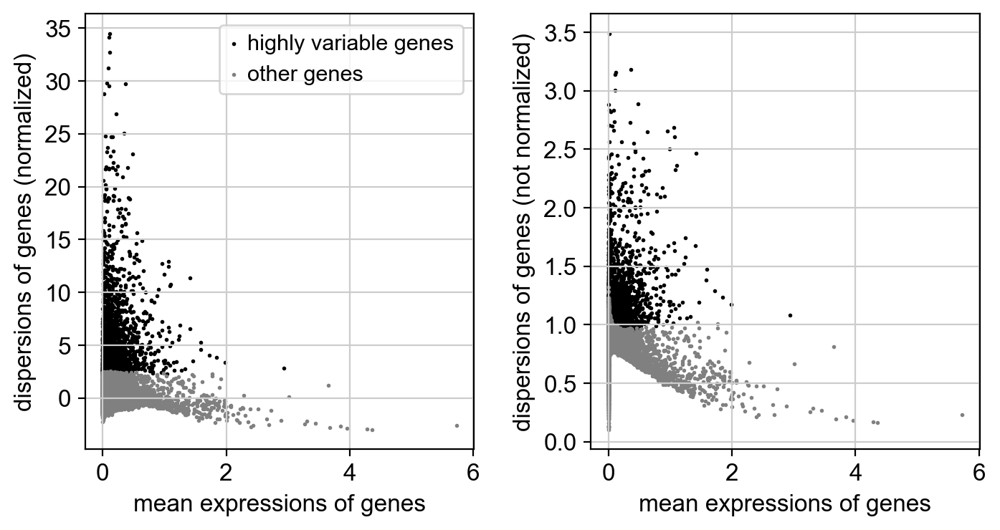

In [12]:
sc.pl.highly_variable_genes(adata_postnorm)

## Visualization

In [13]:
sc.pp.pca(adata_postnorm, n_comps=50, use_highly_variable=True, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)


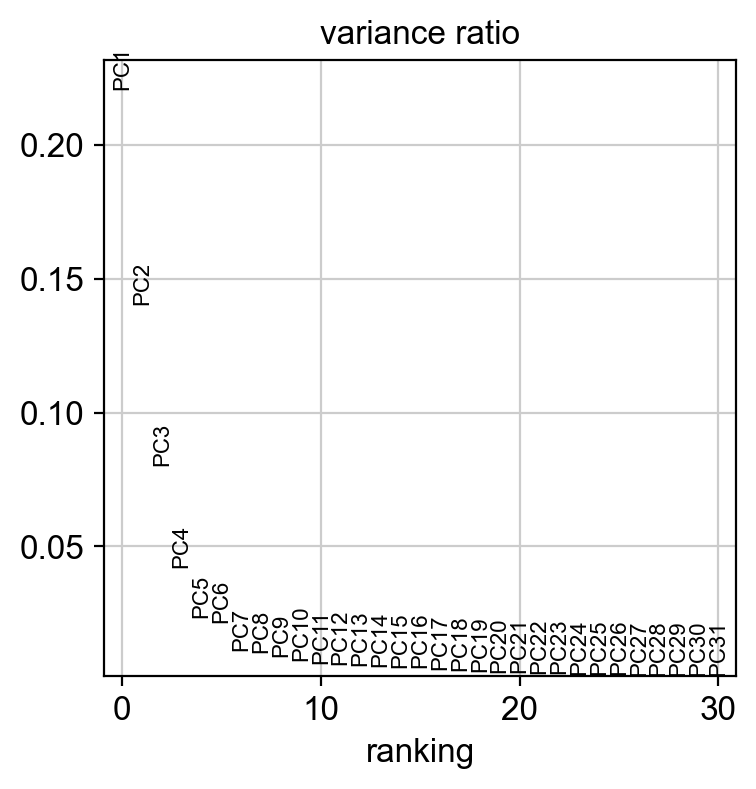

In [14]:
sc.pl.pca_variance_ratio(adata_postnorm)

In [15]:
sc.pp.pca(adata_postnorm, n_comps=9, use_highly_variable=True, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=9
    finished (0:00:02)


In [16]:
sc.pp.neighbors(adata_postnorm, n_neighbors=30)

computing neighbors
    using 'X_pca' with n_pcs = 9


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [17]:
sc.tl.umap(adata_postnorm)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:43)


running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)


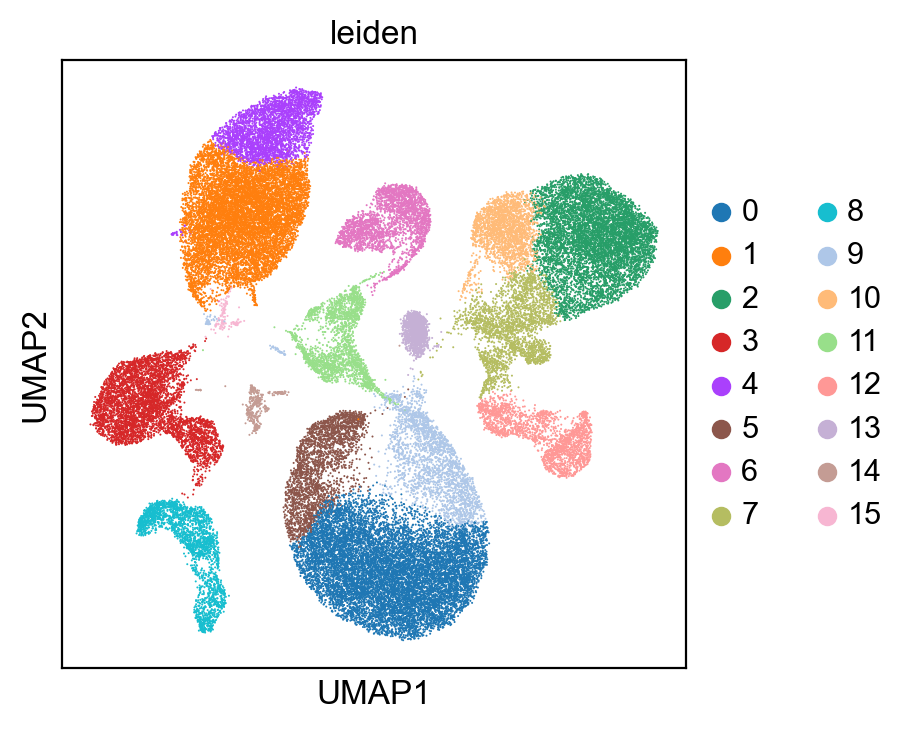

In [18]:
sc.tl.leiden(adata_postnorm, resolution=0.4)
sc.pl.umap(adata_postnorm, color = 'leiden')

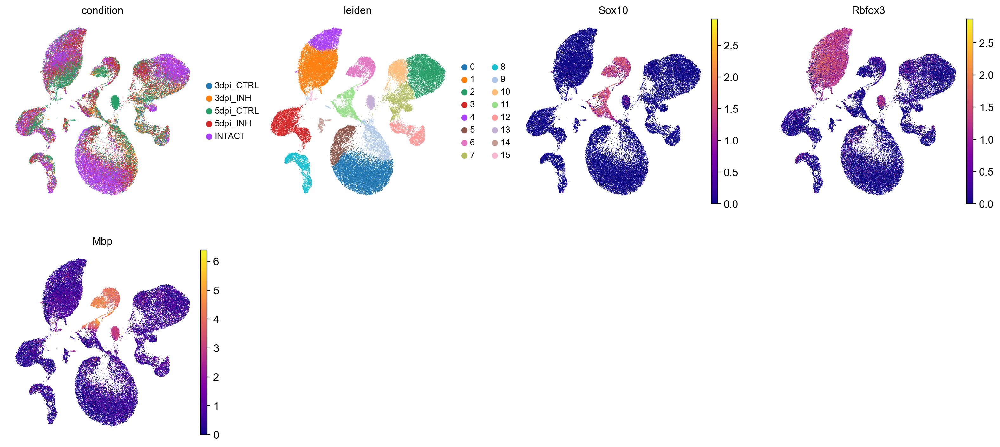

In [19]:
sc.pl.umap(adata_postnorm, color=['condition', 'leiden','Sox10', 'Rbfox3', 'Mbp'], legend_fontsize =float(10), legend_fontweight= 'normal', frameon= False )

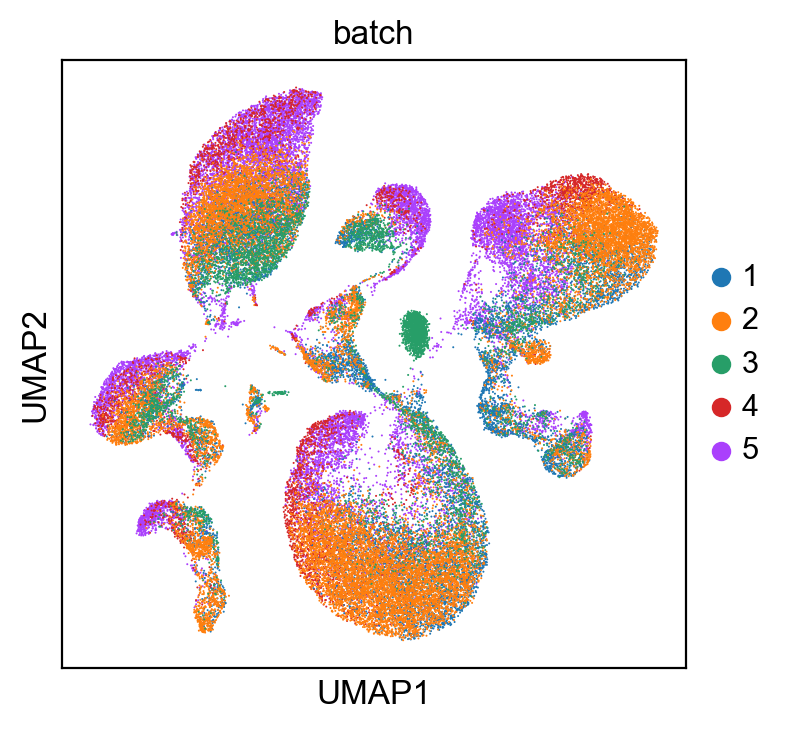

In [20]:
sc.pl.umap(adata_postnorm, color=['batch'])

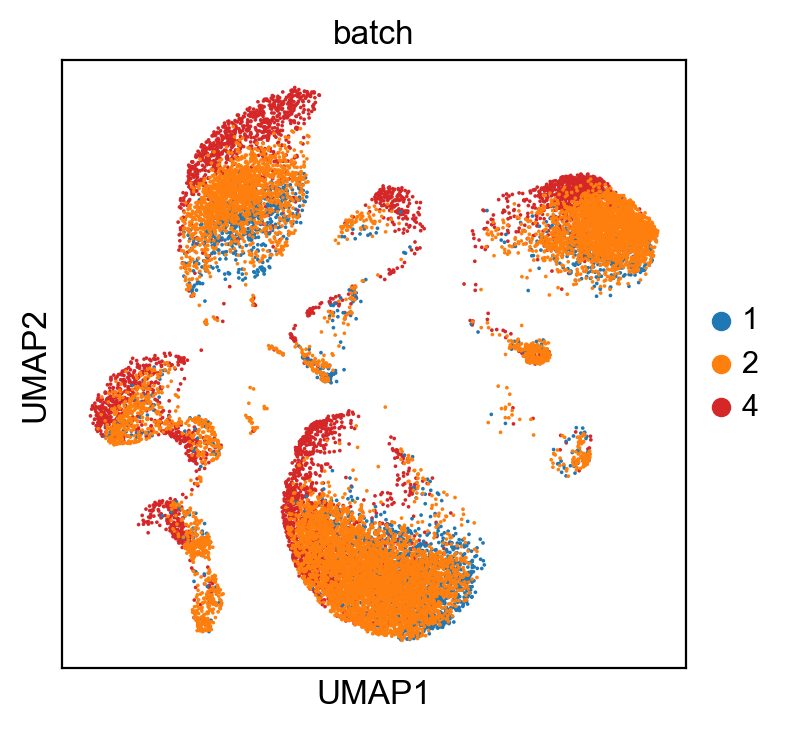

In [21]:
sc.pl.umap(adata_postnorm[adata_postnorm.obs[adata_postnorm.obs['condition'].isin(['INTACT'])].index],color='batch')

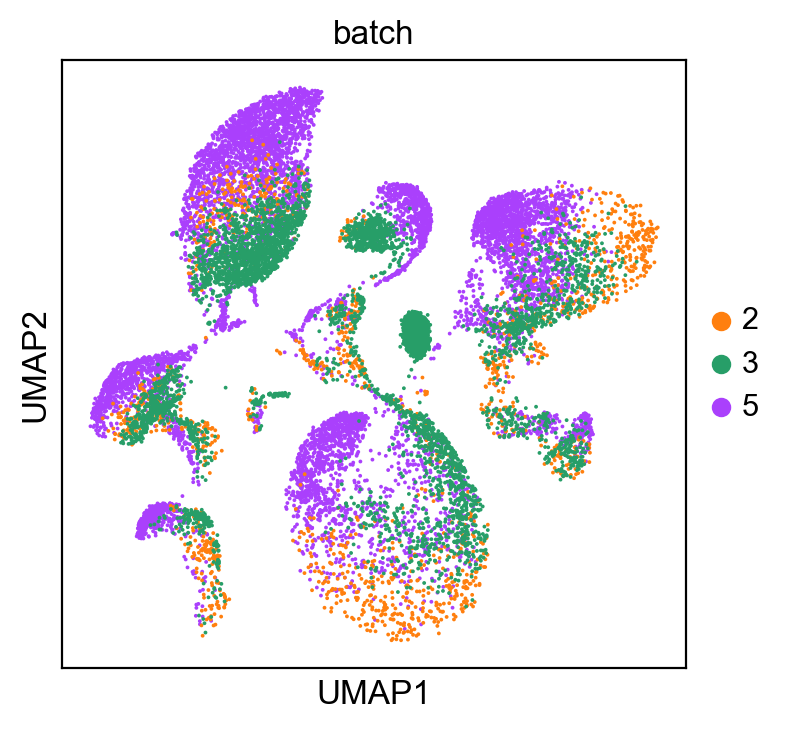

In [22]:
sc.pl.umap(adata_postnorm[adata_postnorm.obs[adata_postnorm.obs['condition'].isin(['5dpi_CTRL'])].index],color='batch')

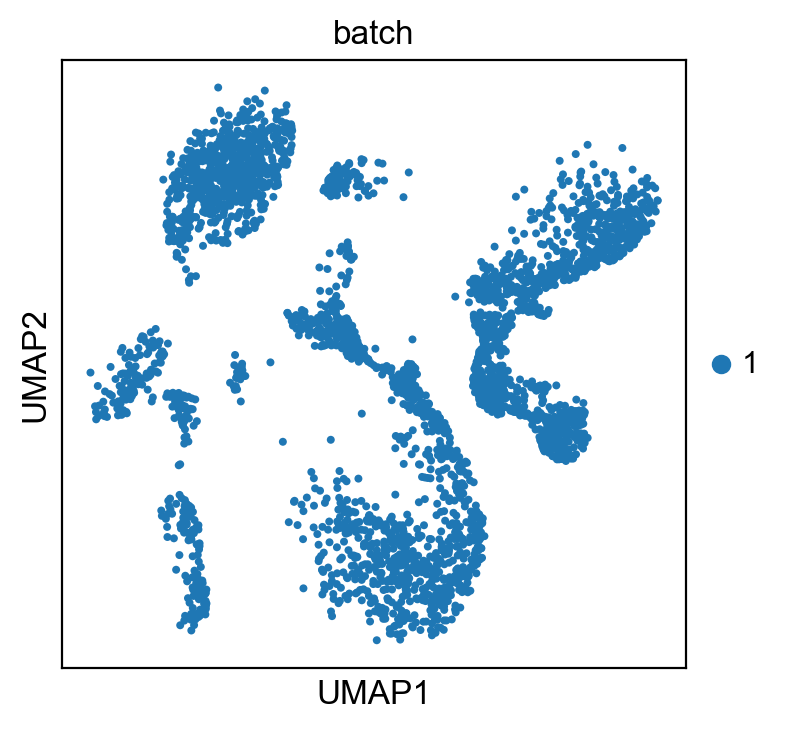

In [23]:
sc.pl.umap(adata_postnorm[adata_postnorm.obs[adata_postnorm.obs['condition'].isin(['3dpi_CTRL'])].index],color='batch')

## scANVI

In [26]:
adata_postnorm_scvi=adata_postnorm.copy()

In [27]:
adata_scANVI_treated= adata_postnorm_scvi.copy()
sc.pp.highly_variable_genes(
    adata_scANVI_treated,
    flavor="seurat_v3",
    n_top_genes=2000,
    layer="counts",
    batch_key="batch",
    subset=True
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [28]:
scvi.model.SCVI.setup_anndata(adata_postnorm_scvi, layer="counts", batch_key="batch")

In [29]:
vae = scvi.model.SCVI(adata_postnorm_scvi, n_layers=2, n_latent=30, gene_likelihood="nb")
vae.train()
adata_postnorm_scvi.obsm["X_scVI"] = vae.get_latent_representation()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 141/141: 100%|█| 141/141 [15:32:36<00:00, 81.05s/it, loss=6.72e+03, v_num=

`Trainer.fit` stopped: `max_epochs=141` reached.


Epoch 141/141: 100%|█| 141/141 [15:32:36<00:00, 396.85s/it, loss=6.72e+03, v_num


In [30]:
adata_postnorm_scvi.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata_postnorm_scvi, use_rep="X_scVI")
sc.tl.leiden(adata_postnorm_scvi)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 39 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)


In [31]:
adata_postnorm_scvi

AnnData object with n_obs × n_vars = 56786 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'sample_id_colors', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'condition_colors', 'batch_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs'
    layers: 'counts', 'counts_lognorm', 'scaled'
    obsp: 'distances',

In [32]:
adata_postnorm_scvi.obsm["X_mde"] = mde(adata_postnorm_scvi.obsm["X_scVI"])

In [33]:
adata_postnorm_scvi.write(data_dir+today+ "adata_postnorm_scvi.h5ad",compression='gzip')

In [34]:
data_dir+today

'/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/data/230516'

In [44]:
adata_postnorm_scvi = sc.read("/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/data/230516adata_postnorm_scvi.h5ad")

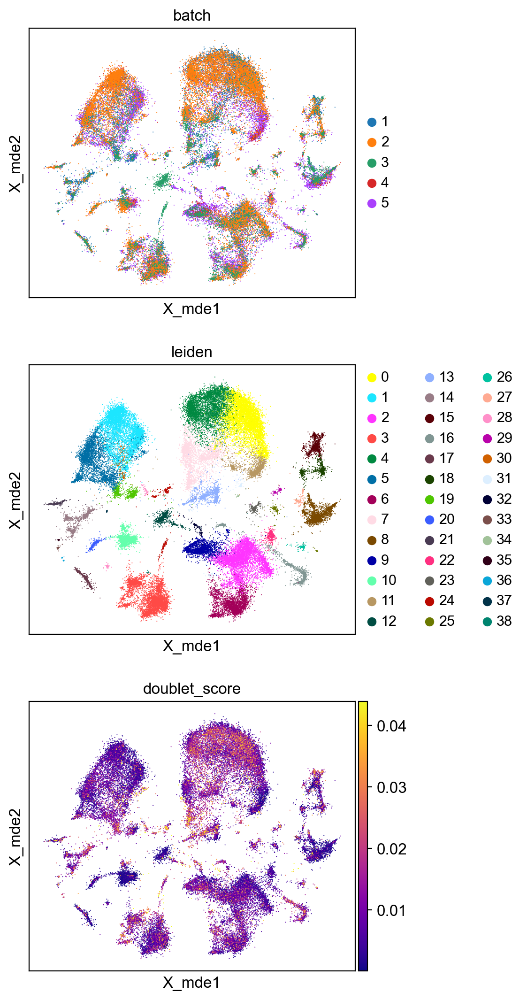

In [45]:
sc.pl.embedding(
    adata_postnorm_scvi,
    basis="X_mde",
    color=["batch", "leiden",'doublet_score'],
    ncols=1,
)


In [46]:
Christina_genes = ['Sox9','Sox10','Aif1','Rbfox3','Gfap','Gpr17','P2ry12','Slc17a7','Aldh1l1','Mag','Cx3cr1','Gabra1','Atp1b2','Pdgfra', 'Cd68', 'Serpina3n', 'Lcn2']

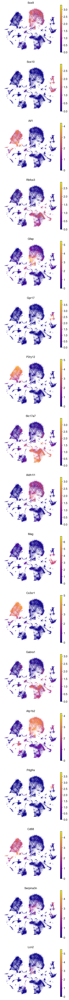

In [48]:
sc.pl.embedding(
    adata_postnorm_scvi,
    basis="X_mde",
    color=Christina_genes,
    frameon=False,
    ncols=1,
)


In [50]:
adata_postnorm_scvi.obs['batch'].value_counts()

2    19095
5    16218
1    10939
3     5874
4     4660
Name: batch, dtype: int64

In [13]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_postnorm_scvi, use_rep="X_scVI")


computing neighbors


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [52]:
sc.tl.umap(adata_postnorm_scvi)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)


In [54]:
# neighbors were already computed using scVI
sc.tl.leiden(adata_postnorm_scvi, key_added="leiden_scVI")

running Leiden clustering
    finished: found 39 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:06)


In [ ]:
adata_postnorm_scvi

In [65]:
adata_postnorm_scvi.obs['leiden13']=adata_postnorm.obs['leiden']

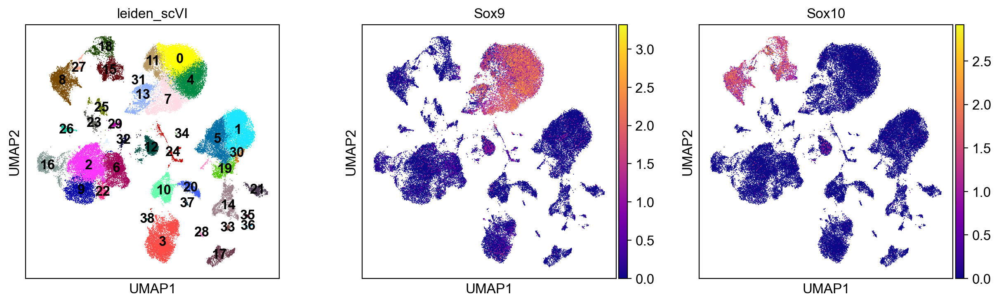

In [62]:
sc.pl.umap(adata_postnorm_scvi, color=['leiden_scVI','Sox9','Sox10'], legend_loc='on data')

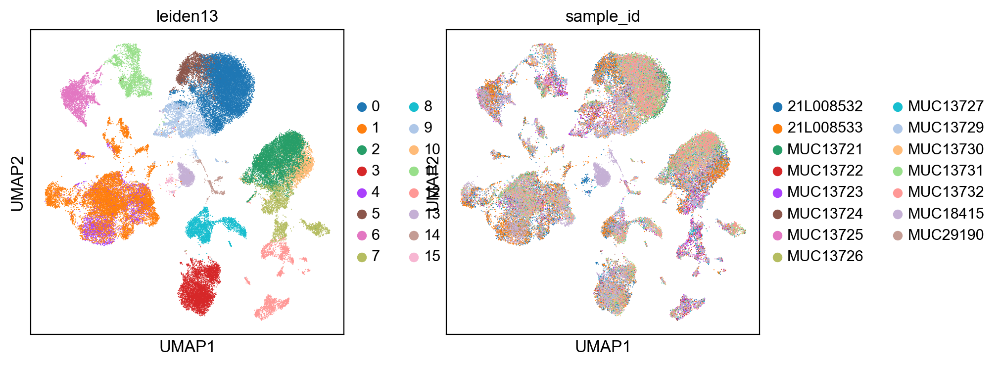

In [75]:
sc.pl.umap(adata_postnorm_scvi, color=['leiden13','sample_id'])

In [56]:
sc.tl.rank_genes_groups(adata_postnorm_scvi, groupby='leiden_scVI', key_added='rank_genes_treated_annotated', method='t-test_overestim_var', use_raw=True)

ranking genes
    finished: added to `.uns['rank_genes_treated_annotated']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:51)


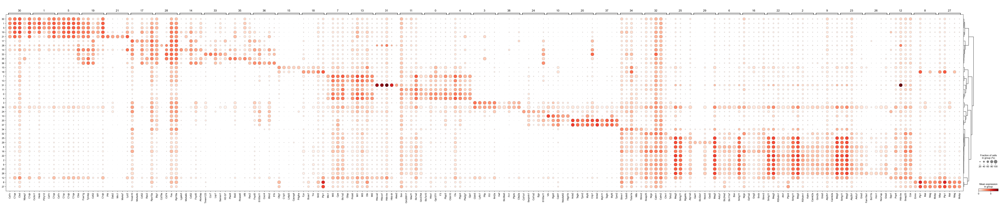

In [59]:
sc.pl.rank_genes_groups_dotplot(adata_postnorm_scvi, n_genes=5, key='rank_genes_treated_annotated' )

In [ ]:
Markers_all_cells ={'Microglia': ['Tmem119', 'Cx3cr1', 'P2ry12', 'P2ry13', 'Gpr34', 'Olfml3', 'Selplg', 'Sparc', 'Fcrls', 'Siglech', 'Slc2a5','Mafb', 'Pmepa1', 'Cd14'],
                   'DAM':['Lpl','Cst7'], 
                   'Macrophages':['Itga4', 'Tgfbi', 'Ifitm2', 'Ifitm3', 'Tagln2','F13a1', 'Kynu', 'S100a11', 'S100a6'],
                   'BAM': [ 'Cd163', 'Mrc1','Lyve1', 'Siglec1'],
                   'Monocytes':['Ly6c2','Ccr2','Spn'],
                   'DCs':['Cd24a','Itgax','Bst2','Cd209a','Xcr1','Ccr7','Ccr9', 'Flt3','Itgae', 'Itgam','H2-Oa','Tnni2','Kctd14','Amica1','Kmo','Hepacam2'], 
                   'NKT cells':['Cd3e','Klrb1c','Ncr1'],
                   'T cells':['Cd3d','Cd3e','Cd3g','Lat','Bcl11b'],
                   'B cells':['Cd19', 'Ms4a1', 'Sdc1', 'Pax5', 'Ms4a1'],
                   'Neutrophils': ['S100a9'],
                   'Neurons':['Rbfox3','Slc17a7','Gabra1', 'Cux1','Pou3f2','Bcl11b', 'Foxp2'],
                   'OPCs':['Pdgfra', 'C1ql1'],
                   'COPs':['Neu4', 'Brca1'],
                   'MOL':['Opalin', 'Ninj2'],
                   'Astrocytes':['Sox9', 'Gfap','Aldh1l1','Atp1b2', 'Vim','Gfap','Slc1a3','Aldoc'],
                   'Pericytes':['Pecam1','Pdgfrb', 'Higd1b','Ndufa4l2','Rgs5','Kcnj8','Flt1'],
                   'VSMCs':['Acta2', 'Tagln','Myh11', 'Mustn1','Map3k7cl'],
                   'VLMCs':['Mgp', 'Slc47a1',  'Thbd', 'Col1a1', 'Col1a2'],
                   'VECV': ['Ly6c1','Cldn5', 'Ly6a','Pltp','Pglyrp1', 'Scgb3a1']
                  }#Ochocka et al., 2021, van Hove et al., 2016, Zeisel et al. 2018

In [ ]:
for names in list(Markers_all_cells):
    sc.tl.score_genes(adata_postnorm_scvi, Markers_all_cells[names], score_name=names )

In [69]:
adata_postnorm.obs['condition'].value_counts()

INTACT       16965
5dpi_CTRL    15898
5dpi_INH     15660
3dpi_INH      4617
3dpi_CTRL     3646
Name: condition, dtype: int64

In [70]:
adata_postnorm_scvi.obs['condition'].value_counts()

INTACT       16965
5dpi_CTRL    15898
5dpi_INH     15660
3dpi_INH      4617
3dpi_CTRL     3646
Name: condition, dtype: int64

In [71]:
adata_postnorm_scvi.write(data_dir+today+ "adata_postnorm_scvi_proc.h5ad",compression='gzip')

In [72]:
data_dir+today

'/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/data/230516'